<a href="https://colab.research.google.com/github/AskandaMahajan/dog-breed-identification/blob/main/dog_vision_udemy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


In [ ]:
!wget https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip # download files from Dropbox as zip

import os
import zipfile

local_zip = 'dog-breed-identification.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('Dog Vision') # unzip the files into a file called "Dog Vision"
zip_ref.close()

--2024-03-28 11:44:35--  https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/9kjr0ui9qbodfao/dog-breed-identification.zip [following]
--2024-03-28 11:44:35--  https://www.dropbox.com/s/raw/9kjr0ui9qbodfao/dog-breed-identification.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc880b1f340851dd04fc3d91c3cc.dl.dropboxusercontent.com/cd/0/inline/CP8MCDSpNtWrt08dWHuUSwjM2Szf9zYT-HY6tkXqKLeP-Bm2ia0I-vEIyRyXElfiHPGihPYAEyOr5pBgQhh5zWu_6JKLIQP-WRV-3bOhUTTp0HB5MsEvhmeSV11GwovFHn9rQgF5d4IMaZCzFTr39bOG/file# [following]
--2024-03-28 11:44:35--  https://uc880b1f340851dd04fc3d91c3cc.dl.dropboxusercontent.com/cd/0/inline/CP8MCDSpNtWrt08dWHuUSwjM2Szf9zYT-HY6tkXqKLeP-Bm2ia0I-v

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

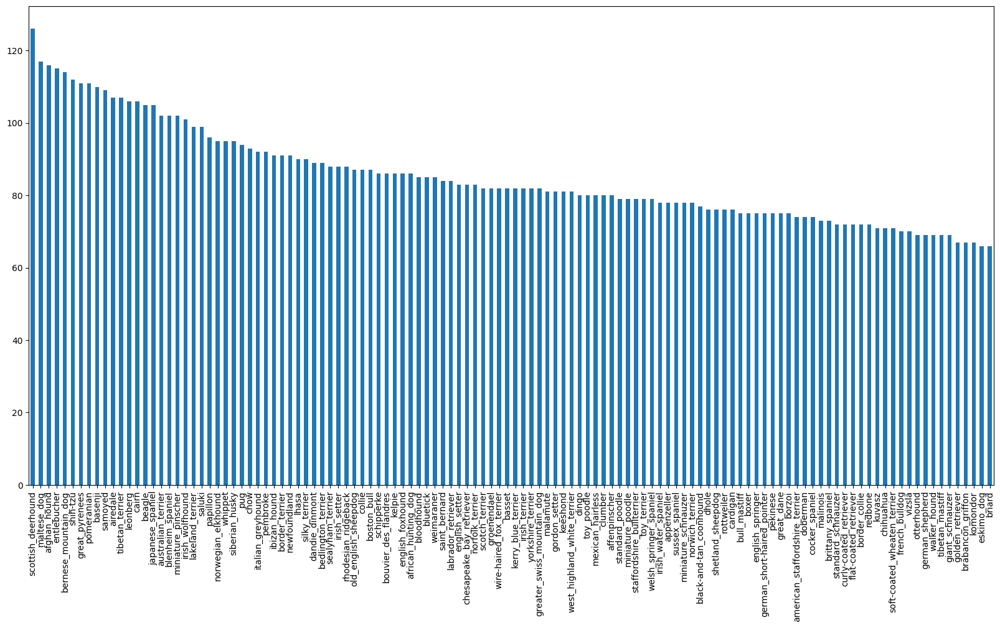

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()


82.0

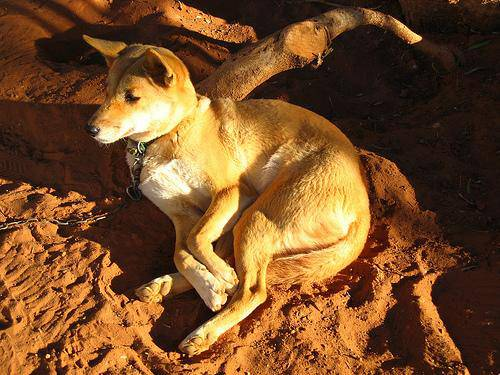

Label: dingo


In [ ]:

import pandas as pd
from IPython.display import Image

# Define the path to the image
image_path = "/content/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg"

# Load the labels from the labels.csv file
labels_df = pd.read_csv("/content/Dog Vision/labels.csv")  # Update with the path to your labels.csv file

# Extract the filename from the image path
image_filename = image_path.split("/")[-1].split(".")[0]

# Find the corresponding label in the labels DataFrame
label = labels_df[labels_df["id"] == image_filename]["breed"].values[0]

# Display the image
display(Image(image_path))

# Print the label
print("Label:", label)



### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:

labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["/content/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


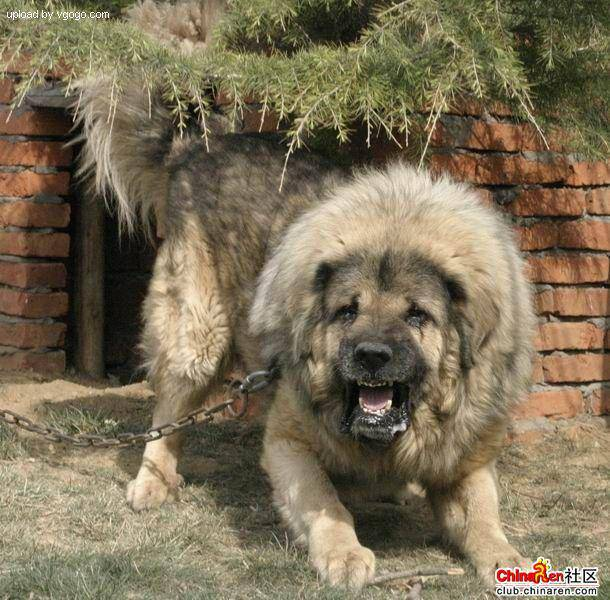

In [ ]:
# One more check
Image(filenames[9000])


In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:

# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:

print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:

boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:

filenames[:10]

['/content/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.



In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels



In [ ]:

len(filenames)



10222

We're going to start off experimenting with ~1000 images and increase as needed.



In [ ]:


# Set number of images to use for experimenting
NUM_IMAGES = 10000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(8000, 8000, 2000, 2000)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/Dog Vision/train/e86be20abe3ab746179728fa6f19bc59.jpg',
  '/content/Dog Vision/train/269a6aeefd8050aafda02044c9cd2a80.jpg',
  '/content/Dog Vision/train/2974dccc97c0cb25f7873e33a4730f47.jpg',
  '/content/Dog Vision/train/99b31cac1b20997c30d49cd6a2d9cde4.jpg',
  '/content/Dog Vision/train/a7702c83da79d54e27d2e9b1f01fe64e.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
          True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fa

### Preprocessing Images (turning images into Tensors)
Tensors are the numerical representations.

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image


Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:

image[:2] # on CPU

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2] # will run faster on GPU

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
# Define image size #preprocess images aka turn them into tensors
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

tensorflow likes to see things in form of data  batch. it works like give me image and its label and i can process on that really fast.

32 is generally the best batch size in most dl models.

training with large minibatches is bad as it'll end up giving some error most probably.


### Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE) # .batch() combines consecutive elements of this dataset into batches and the batch size will be 32 as defined above
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...") #as training dataset so no need to shuffle it
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off") #if we remove this itll print axis laong the sides of 25 images like a graph so thats y grid is off

In [ ]:
train_data #as the images are in batch so we need to unbatch it to visualie it

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

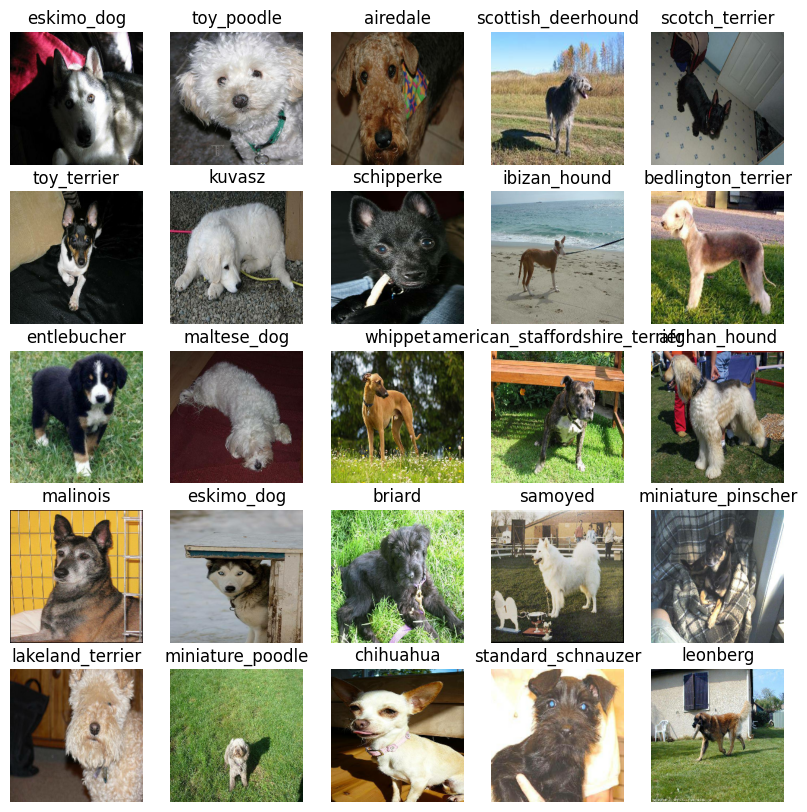

In [ ]:
# Now let's visualize the data in a training batch

train_images, train_labels = next(train_data.as_numpy_iterator()) #unbatching data to numpy
show_25_images(train_images, train_labels) #if we dont pput show_25_images inthis line itll give us the arrays as numpy so whenn we put hsow itll give us images directly
#these all images are from training batch
#everytime u run this code itll give different images bcs above weve used shuffle train dataset so thats y ouput will be shuffled everytime

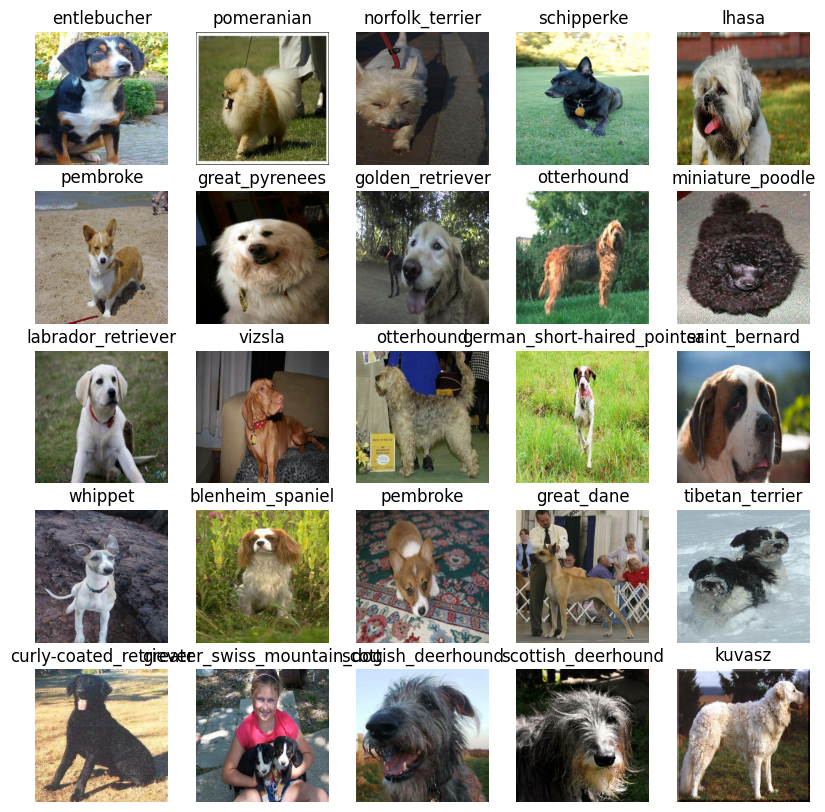

In [ ]:
# # Now let's visualize our validation set

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

#same will happen in this code also but here the images will be from valid dataset  and it wont be shuffled

### Building a model
Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
#tensorflow hub is a library for reusable machine learning modules
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4" #imagenet is an image database

In [ ]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting). tfhub.dev
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential #linear stack of layers;just a stack of layers that takes some input, find the pattern in that input and find output out  of that.
  ([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(), #Adam optimizer that perform well on most of the models ; ml optimizer
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=(224, 224, 3), output_shape=120, model_url="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url),  # Layer 1 (input layer)
        tf.keras.layers.Dense(units=output_shape, activation="softmax")  # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    # Build the model with the correct input shape
    model.build((None,) + input_shape)

    return model


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and

another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) #monitors validation accuracy and as soon as it stops improving for 3 epochs we'll stop training our model.

### Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS, #how many times our data is allowed to look at the training data before it stops or how many chances our model have to pass over the entire training dataset to find dataset
            validation_data=val_data, #databatch
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model() #goal is minimize loss and maximize accuracy

#we can tell that this model is overfitting as the accuracy of training data is more than that of validation accuracy

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
250/250 [==============================] - 26s 81ms/step - loss: 1.5106 - accuracy: 0.6352 - val_loss: 0.7385 - val_accuracy: 0.7700
Epoch 2/100
250/250 [==============================] - 19s 78ms/step - loss: 0.4107 - accuracy: 0.8825 - val_loss: 0.6850 - val_accuracy: 0.7940
Epoch 3/100
250/250 [==============================] - 22s 87ms/step - loss: 0.2349 - accuracy: 0.9388 - val_loss: 0.6392 - val_accuracy: 0.8060
Epoch 4/100
250/250 [==============================] - 20s 78ms/step - loss: 0.1457 - accuracy: 0.9681 - val_loss: 0.6507 - val_accuracy: 0.8030
Epoch 5/100
250/250 [==============================] - 19s 75ms/step - loss: 0.0989 - accuracy: 0.9836 - val_loss: 0.6589 - val_accuracy: 0.8050
Epoch 6/100
250/250 [==============================] - 17s 69ms/step - loss: 0.0710 - accuracy: 0.9908 - val_loss: 0.6576 - val_accuracy: 0.8075
Epoch 7/100
250/250 [================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/Dog\ Vision/logs


<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

63/63 [==============================] - 5s 79ms/step


array([[8.2268253e-10, 1.2616312e-11, 3.2998262e-10, ..., 3.4441083e-10,
        2.4834986e-08, 2.1994993e-11],
       [6.4993955e-08, 3.1808944e-09, 2.6814058e-11, ..., 1.0393077e-11,
        1.3864680e-10, 1.0260315e-09],
       [7.9529372e-04, 9.4801308e-06, 3.4982728e-05, ..., 5.4207425e-07,
        3.5503312e-05, 4.2779306e-03],
       ...,
       [1.7009706e-05, 3.9511224e-06, 4.1155110e-07, ..., 3.8738995e-06,
        3.9472020e-06, 1.2304085e-02],
       [9.4845207e-09, 1.9387572e-09, 2.6767211e-10, ..., 4.6687653e-08,
        7.7627839e-05, 3.2045953e-09],
       [1.0080726e-08, 7.8756811e-06, 1.8753891e-10, ..., 4.5618687e-10,
        5.8820490e-07, 1.7270111e-06]], dtype=float32)

In [ ]:
predictions[0]

array([8.22682533e-10, 1.26163116e-11, 3.29982625e-10, 8.05539280e-09,
       2.30050532e-07, 2.73291353e-05, 6.66840494e-09, 3.75877022e-07,
       2.79936740e-10, 1.60588388e-06, 1.77712145e-09, 2.01834620e-08,
       3.25788704e-07, 1.61831892e-09, 1.16986268e-10, 4.83393819e-07,
       3.03001091e-09, 4.84073315e-09, 4.75868615e-11, 5.79845238e-09,
       1.52170221e-10, 1.89106383e-10, 5.88758264e-10, 1.25526794e-11,
       4.11691587e-08, 1.35229272e-09, 1.78917536e-12, 9.96181537e-09,
       1.28081296e-10, 1.30246325e-09, 2.31518207e-10, 7.06989800e-10,
       7.28943121e-12, 1.39118189e-10, 6.52390031e-10, 1.75312065e-09,
       1.93095104e-08, 4.98361769e-11, 1.12742287e-08, 2.23645173e-07,
       4.71227883e-11, 2.89142998e-11, 9.99958634e-01, 3.36681816e-09,
       4.00085347e-11, 3.63549607e-11, 6.58775465e-11, 2.14150659e-11,
       1.91413996e-10, 4.65652430e-12, 8.95495234e-10, 1.08566295e-10,
       4.39031894e-10, 5.77656056e-06, 4.18682519e-11, 2.01684536e-08,
      

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.11274323e-08 1.28461422e-10 5.86690234e-08 4.43217435e-10
 5.91502403e-09 2.23217995e-07 1.41166004e-06 1.24961455e-08
 5.78784659e-11 3.34966721e-10 2.61136196e-10 1.63671882e-10
 7.31039063e-06 5.50939502e-12 6.36945927e-08 2.61175054e-10
 9.75499681e-09 7.42139417e-09 1.70181758e-10 1.75436881e-07
 4.14868628e-09 1.18763721e-09 3.83154131e-08 2.28539232e-08
 1.45957924e-09 8.60960053e-11 6.07727202e-11 2.98773051e-09
 8.04908584e-10 2.77038293e-06 4.76349550e-11 1.16746793e-10
 7.02223132e-12 2.04030948e-09 5.55986581e-08 1.32276551e-10
 2.54230281e-09 3.28632979e-08 1.16190109e-04 1.49264823e-09
 3.94594690e-10 3.50003637e-11 1.13958920e-09 3.34197148e-06
 1.80149627e-07 5.87897802e-08 1.40963004e-06 9.75736991e-11
 6.81122547e-10 1.14746790e-08 3.87283343e-08 2.21502108e-10
 1.32447042e-09 2.41289001e-07 3.52754022e-08 1.56457446e-07
 1.81452264e-09 8.92371421e-09 1.35598865e-08 4.20322721e-10
 4.87924829e-08 5.87095789e-11 1.25814725e-09 9.99414563e-01
 3.79710769e-08 1.809111

In [ ]:
unique_breeds[113]

'walker_hound'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'lakeland_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:

val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.96884924, 0.9701885 , 0.6773138 ],
         [0.9649684 , 0.9649684 , 0.6752449 ],
         [0.97255224, 0.97255224, 0.6897149 ],
         ...,
         [0.94544876, 0.93533266, 0.63851905],
         [0.9122807 , 0.90027964, 0.59165734],
         [0.6266023 , 0.6167168 , 0.30141547]],
 
        [[0.9636907 , 0.9677085 , 0.69290984],
         [0.97148985, 0.97514886, 0.7090773 ],
         [0.9998248 , 0.99992114, 0.74782914],
         ...,
         [0.97280353, 0.9686894 , 0.715118  ],
         [0.9849285 , 0.99132735, 0.7000457 ],
         [0.8505023 , 0.8618907 , 0.55982476]],
 
        [[0.94763345, 0.9589167 , 0.70516145],
         [0.96966976, 0.9795524 , 0.73575866],
         [0.9953722 , 0.99858195, 0.7804973 ],
         ...,
         [0.8728771 , 0.8872267 , 0.69398195],
         [0.8451019 , 0.8824005 , 0.6274633 ],
         [0.7930096 , 0.83910555, 0.5551244 ]],
 
        ...,
 
        [[0.47171637, 0.37899917, 0.3959688 ],
         [0.23060554, 0.1464493 , 0.15993

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

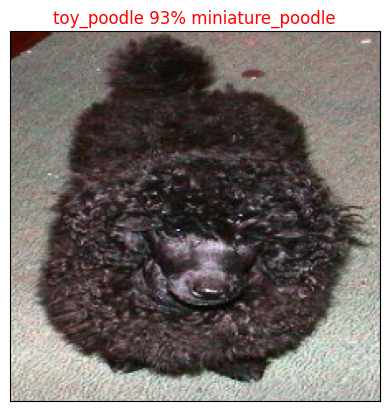

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=9)

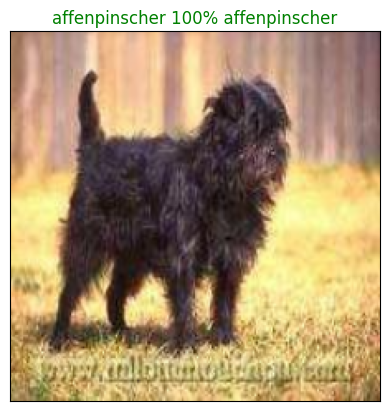

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=79)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


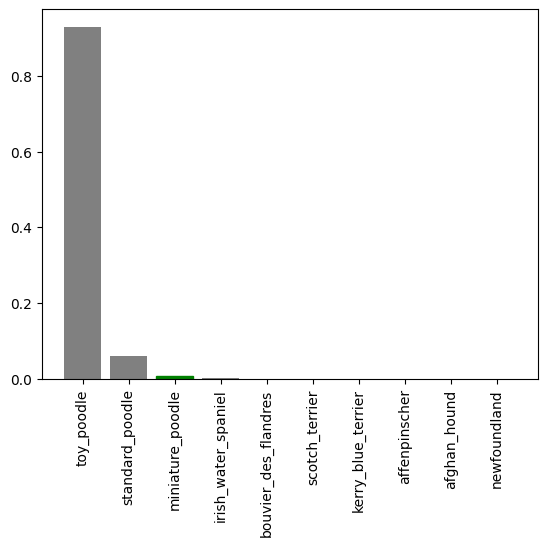

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

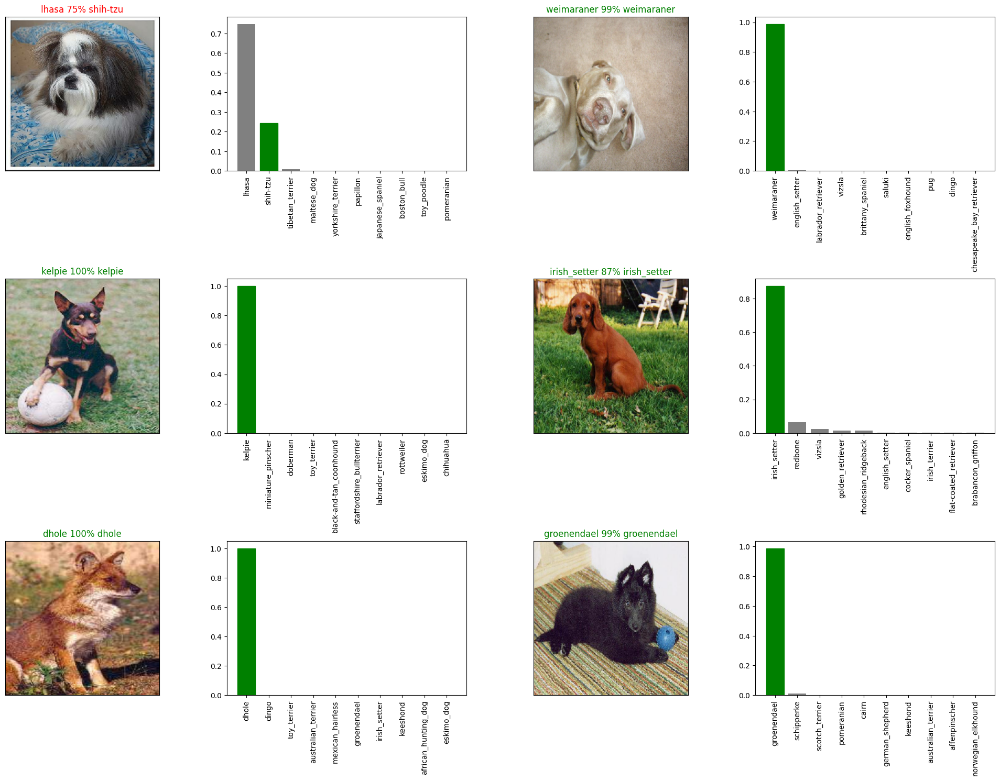

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 40
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

### Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to save a model
def load_model(model_path):
  """
  loads a saved model from a specified path.
  """
  print (f"loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer" :hub.KerasLayer})
  return model


Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/Dog Vision/models/20240328-11511711626683-1000-images-mobilenetv2-Adam.h5...


'/content/Dog Vision/models/20240328-11511711626683-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/Dog Vision/models/20240328-11511711626683-1000-images-mobilenetv2-Adam.h5')

loading saved model from: /content/Dog Vision/models/20240328-11511711626683-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

63/63 [==============================] - 5s 80ms/step - loss: 0.7400 - accuracy: 0.8080


[0.7400339841842651, 0.8080000281333923]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

63/63 [==============================] - 4s 54ms/step - loss: 0.7400 - accuracy: 0.8080


[0.7400339841842651, 0.8080000281333923]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:

# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 27s 68ms/step - loss: 1.3569 - accuracy: 0.6668
Epoch 2/100
320/320 [==============================] - 23s 72ms/step - loss: 0.4019 - accuracy: 0.8812
Epoch 3/100
320/320 [==============================] - 23s 71ms/step - loss: 0.2364 - accuracy: 0.9366
Epoch 4/100
320/320 [==============================] - 21s 66ms/step - loss: 0.1523 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 20s 63ms/step - loss: 0.1068 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 22s 69ms/step - loss: 0.0766 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 22s 68ms/step - loss: 0.0578 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 23s 73ms/step - loss: 0.0464 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 19s 61ms/step - loss: 0.0383 - accuracy: 0.9952
Epoch 10/100
320/320 [==============================] - 26s 80ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/Dog Vision/models/20240328-12031711627434-full-image-set-mobilenetv2-Adam.h5...


'/content/Dog Vision/models/20240328-12031711627434-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/Dog Vision/models/20240328-12031711627434-full-image-set-mobilenetv2-Adam.h5')

loading saved model from: /content/Dog Vision/models/20240328-12031711627434-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.


In [ ]:
# Load test image filenames
test_path = "/content/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/Dog Vision/test/4a5d85b5525bf424f90a2928a13b047d.jpg',
 '/content/Dog Vision/test/cabc63d17379441790a41da2b775fae4.jpg',
 '/content/Dog Vision/test/bd405393e16688e5282b57d92bdbb97b.jpg',
 '/content/Dog Vision/test/e774fbfeb4b712ca042f93edea3835af.jpg',
 '/content/Dog Vision/test/d9a541d73eb08d9764eeb04038c6c235.jpg',
 '/content/Dog Vision/test/57e44eea02e8ef9b3178719a60660fd8.jpg',
 '/content/Dog Vision/test/d688fab5c2743e4ef263b1955668d53b.jpg',
 '/content/Dog Vision/test/d81bede62a151c338f494763ae1e6bc5.jpg',
 '/content/Dog Vision/test/1d39c9e3995e7630805b08ea6871941a.jpg',
 '/content/Dog Vision/test/107cfd7192dd926f205ad8d48fe6a17e.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>


**Note:** Calling predict() on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.



In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 21s 63ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.35367197e-04, 1.27774774e-06, 2.32443176e-09, ...,
        1.89848990e-08, 4.06968407e-04, 9.59317267e-01],
       [5.30647449e-05, 5.05408252e-06, 7.25200107e-06, ...,
        1.62256445e-04, 5.18555520e-04, 3.20584066e-02],
       [4.43413058e-12, 4.62343835e-12, 1.53016461e-10, ...,
        1.68391009e-10, 2.56737955e-08, 1.75401096e-10],
       ...,
       [2.87553813e-12, 9.27203453e-12, 1.38360795e-10, ...,
        1.19896402e-11, 3.68659443e-11, 7.29222793e-11],
       [8.03191469e-09, 1.35469747e-10, 5.84503945e-10, ...,
        4.33090785e-10, 4.48925857e-05, 8.86529321e-08],
       [1.28545347e-04, 2.38984145e-11, 2.36047674e-11, ...,
        1.43282901e-12, 6.71435089e-07, 4.23936988e-04]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,4a5d85b5525bf424f90a2928a13b047d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,cabc63d17379441790a41da2b775fae4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,bd405393e16688e5282b57d92bdbb97b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e774fbfeb4b712ca042f93edea3835af,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,d9a541d73eb08d9764eeb04038c6c235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:

# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,4a5d85b5525bf424f90a2928a13b047d,4.353672e-04,1.277748e-06,2.324432e-09,4.804111e-08,3.096861e-08,1.732396e-13,1.277282e-05,1.363968e-09,7.849289e-13,...,1.233749e-04,9.828921e-07,1.868055e-08,6.827475e-11,1.798872e-10,2.543810e-08,6.118962e-08,1.898490e-08,4.069684e-04,9.593173e-01
1,cabc63d17379441790a41da2b775fae4,5.306474e-05,5.054083e-06,7.252001e-06,4.900608e-06,2.332993e-02,6.646761e-08,1.160282e-02,1.352978e-08,4.196994e-09,...,2.054267e-06,2.284268e-04,6.686482e-05,1.073125e-07,1.161847e-06,8.831990e-05,5.099547e-07,1.622564e-04,5.185555e-04,3.205841e-02
2,bd405393e16688e5282b57d92bdbb97b,4.434131e-12,4.623438e-12,1.530165e-10,2.248329e-09,1.875429e-11,3.069814e-06,7.761970e-11,5.356760e-12,2.657504e-09,...,2.204953e-12,1.535516e-12,2.005363e-11,1.054382e-06,2.467164e-09,6.536611e-10,3.072869e-11,1.683910e-10,2.567380e-08,1.754011e-10
3,e774fbfeb4b712ca042f93edea3835af,1.305248e-08,3.341578e-09,2.459340e-11,1.628415e-04,4.429321e-09,1.634874e-08,2.628448e-07,1.135837e-09,6.482421e-09,...,6.140548e-09,3.045933e-08,5.901400e-07,1.028748e-09,3.370346e-11,1.437247e-08,6.745008e-10,1.903479e-06,8.376174e-05,1.212157e-08
4,d9a541d73eb08d9764eeb04038c6c235,7.763646e-13,9.278018e-09,6.339214e-12,2.678908e-16,6.462733e-14,3.092950e-10,1.510192e-14,6.784320e-09,1.154484e-11,...,1.050991e-10,1.867772e-10,1.536474e-15,5.871423e-11,1.510279e-10,8.056725e-11,6.813211e-13,6.129379e-07,1.242009e-10,9.238239e-08


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.


In [ ]:
# Get custom image filepaths
custom_path = "/content/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/Dog Vision/my-dog-photos/dog-puppy-on-garden-royalty-free-image-1586966191.jpg',
 '/content/Dog Vision/my-dog-photos/.ipynb_checkpoints',
 '/content/Dog Vision/my-dog-photos/golden-retriever-puppy.jpg',
 '/content/Dog Vision/my-dog-photos/little-cute-maltipoo-puppy-royalty-free-image-1652926025.jpg']

In [ ]:
import os

custom_path = "/content/Dog Vision/my-dog-photos/"
custom_image_paths = []

# Iterate through files in custom_path
for fname in os.listdir(custom_path):
    # Check if the file is an image (assuming common image extensions like jpg, jpeg, png)
    if fname.endswith(('.jpg', '.jpeg', '.png')):
        custom_image_paths.append(os.path.join(custom_path, fname))

custom_image_paths


['/content/Dog Vision/my-dog-photos/dog-puppy-on-garden-royalty-free-image-1586966191.jpg',
 '/content/Dog Vision/my-dog-photos/golden-retriever-puppy.jpg',
 '/content/Dog Vision/my-dog-photos/little-cute-maltipoo-puppy-royalty-free-image-1652926025.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 107ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'brittany_spaniel', 'miniature_poodle']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

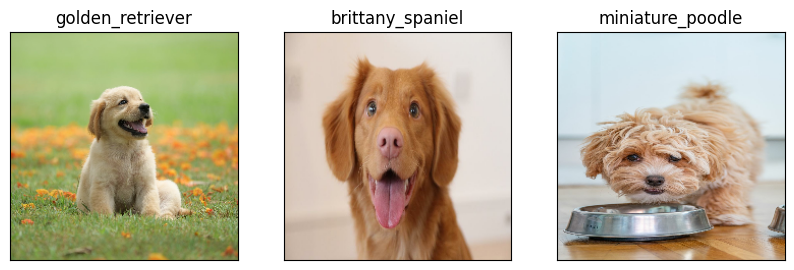

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)